In [1]:
%load_ext autoreload
%autoreload 2

import sys
sys.path.append('../m2vae/')

import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import f1_score
from IPython.display import Audio, display, HTML
import base64

import pretty_midi
import pypianoroll as ppr
from pypianoroll.plot import plot_multitrack

import torch

import vis
import io_util
import wrappers
import util

In [2]:
plt.rcParams["figure.figsize"] = (10,10)

In [3]:
RATE = 22050
EXP_DIR = '../exp/5track_no_kl'
DATA_FILE = '../data/train_x_lpd_5_phr_debug.npz'
args = io_util.parse_args('interactive', exp_dir=EXP_DIR, debug=True, data_file=DATA_FILE)

util.restore_args(args, EXP_DIR)

random = np.random.RandomState(args.seed)

dataloaders, pos_prop = wrappers.load_data(args, random_state=random,
                                           use_random_transpose=False)
model, optimizer, loss = wrappers.build_mvae(args, pos_prop=pos_prop)

util.restore_checkpoint(model, optimizer, args.exp_dir,
                        cuda=args.cuda,
                        filename='model_best.pth')

model.eval();

In [15]:
# Load one batch and pass through model
tracks = next(iter(dataloaders['train']))
tracks = [tracks[:, :, :, :, i] for i in range(args.n_tracks)]
with torch.no_grad():
    tracks_recon, z = model(tracks, return_z=True)

tracks_np = [t.cpu().numpy().astype(np.bool_) for t in tracks]
tracks_recon_np = [(t.cpu().numpy() > 0.0).astype(np.bool_) for t in tracks_recon]

f1s = [f1_score(t.flatten(), tr.flatten()) for t, tr in zip(tracks_np, tracks_recon_np)]

print("This batch F1: {:.3f}".format(sum(f1s) / args.n_tracks))

# Reshape to group tracks
tracks_grouped = [tuple(t[i] for t in tracks_np) for i in range(tracks_np[0].shape[0])]
tracks_recon_grouped = [tuple(t[i] for t in tracks_recon_np) for i in range(tracks_recon_np[0].shape[0])]

This batch F1: 0.875


# Example Reconstructions

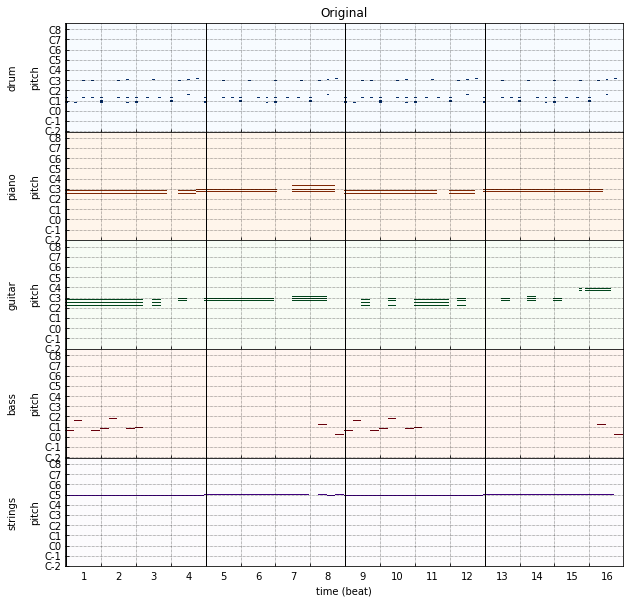

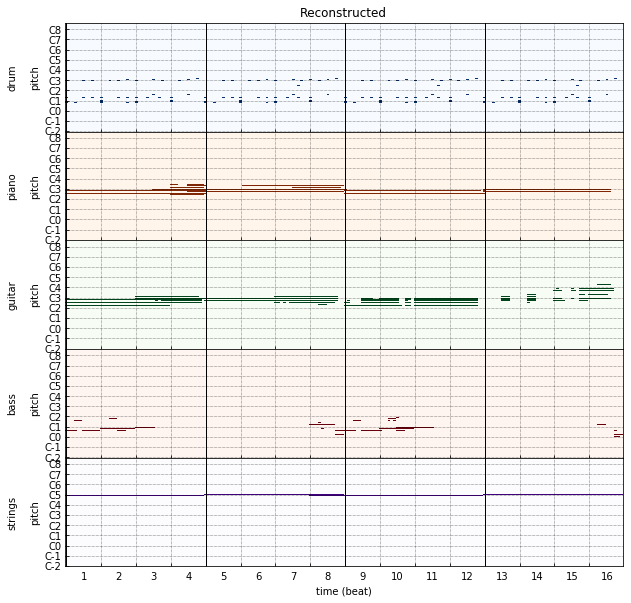

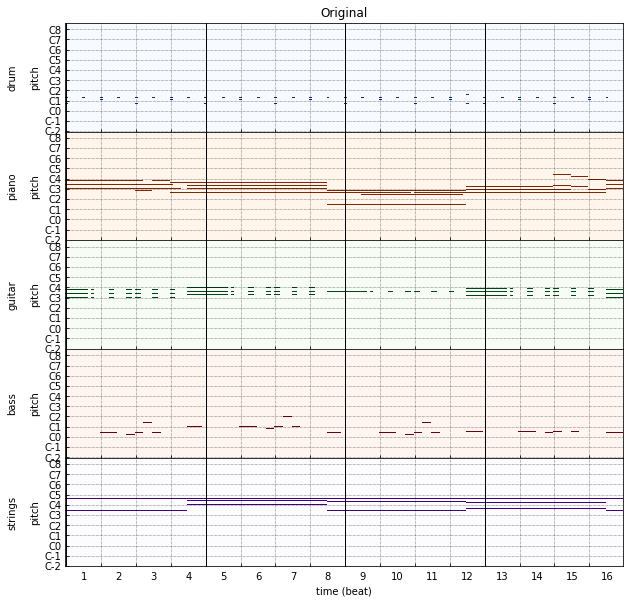

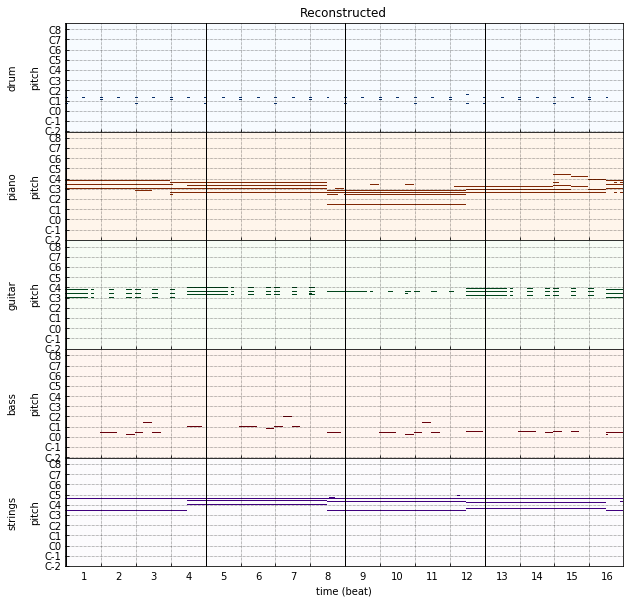

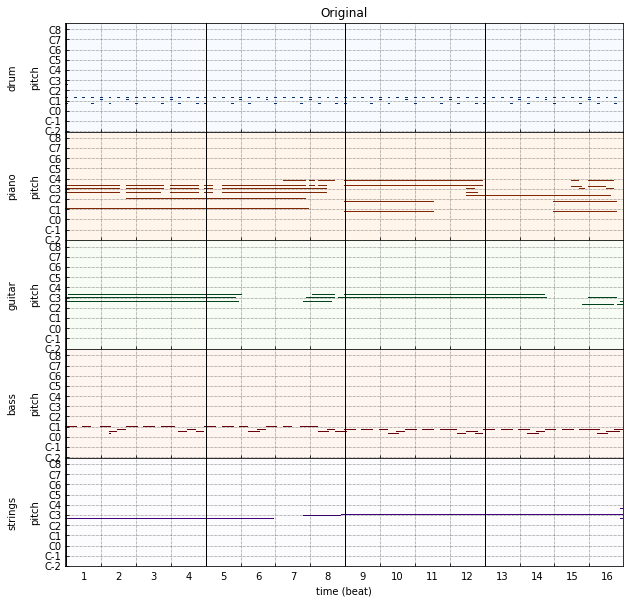

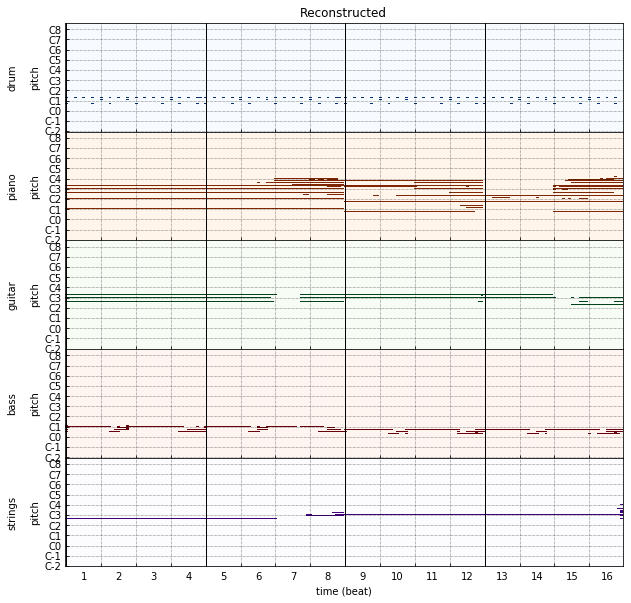

In [16]:
N_DISPLAY = 3
for track, track_recon, i in zip(tracks_grouped, tracks_recon_grouped, range(N_DISPLAY)):
    mt = vis.to_multitrack(track)
    mt_recon = vis.to_multitrack(track_recon)
    
    audio = vis.synthesize(mt, rate=RATE)
    audio_recon = vis.synthesize(mt_recon, rate=RATE)
    
    vis.ipy_display(audio, 'Original', rate=RATE)
    vis.ipy_display(audio_recon, 'Reconstructed', rate=RATE)

    fig, axs = plot_multitrack(mt)
    axs[0].set_title('Original')
    fig, axs = plot_multitrack(mt_recon)
    axs[0].set_title('Reconstructed')

    plt.show()

# Interpolations

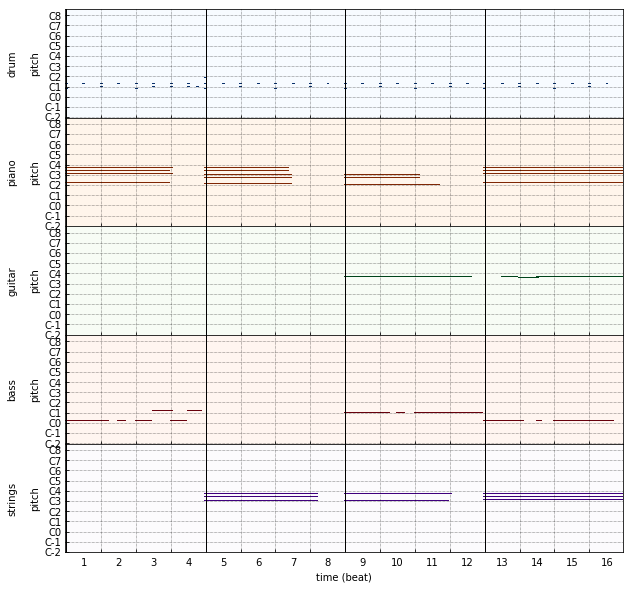

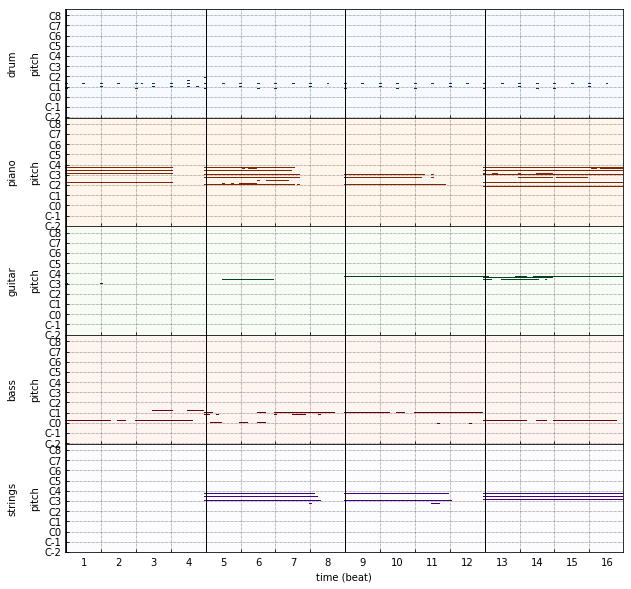

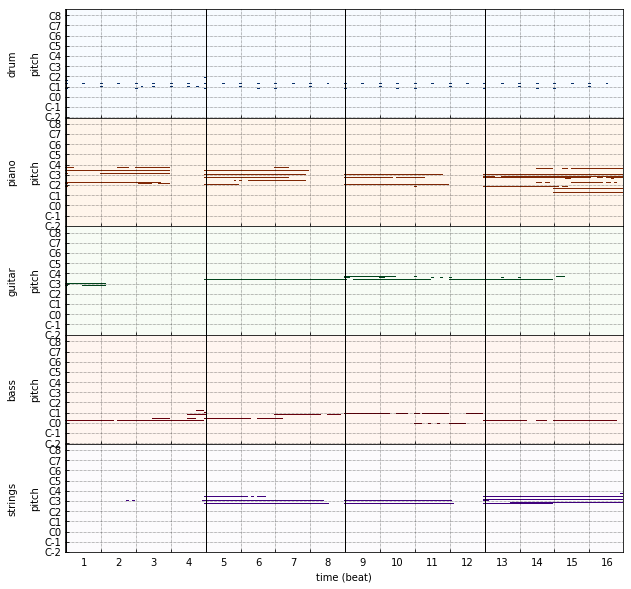

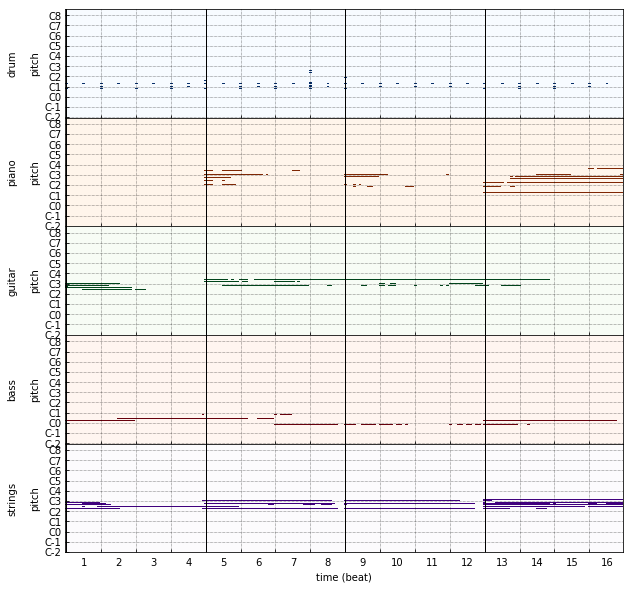

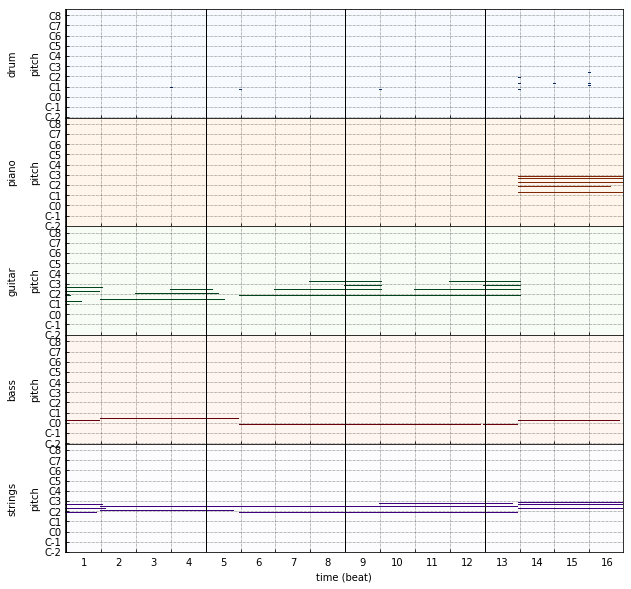

...

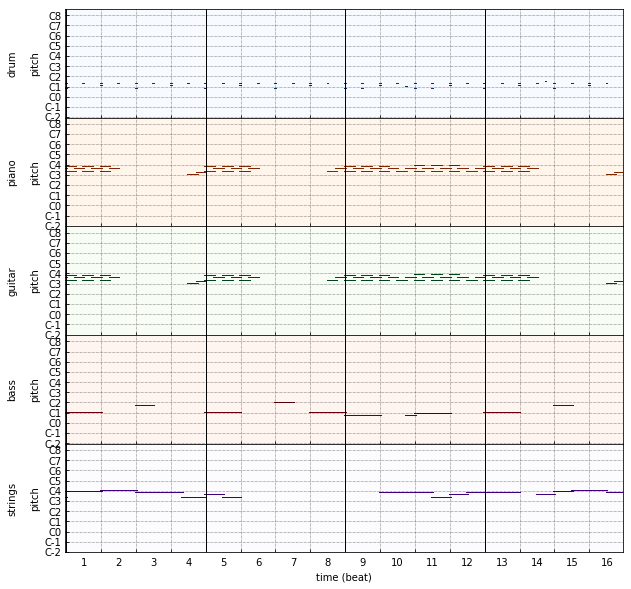

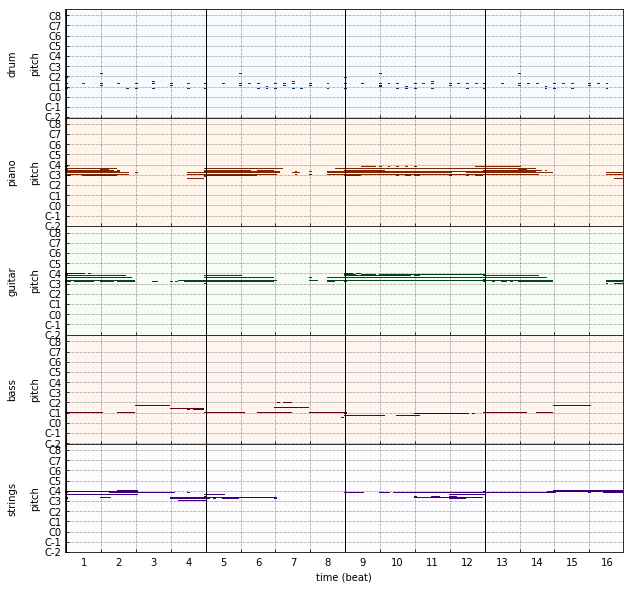

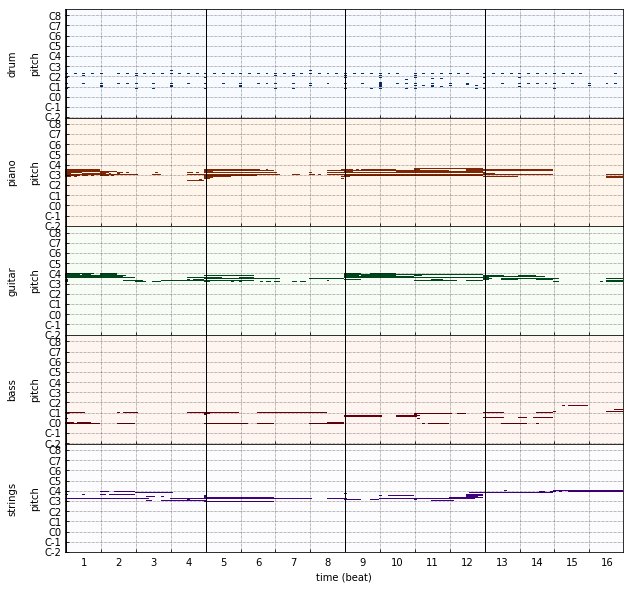

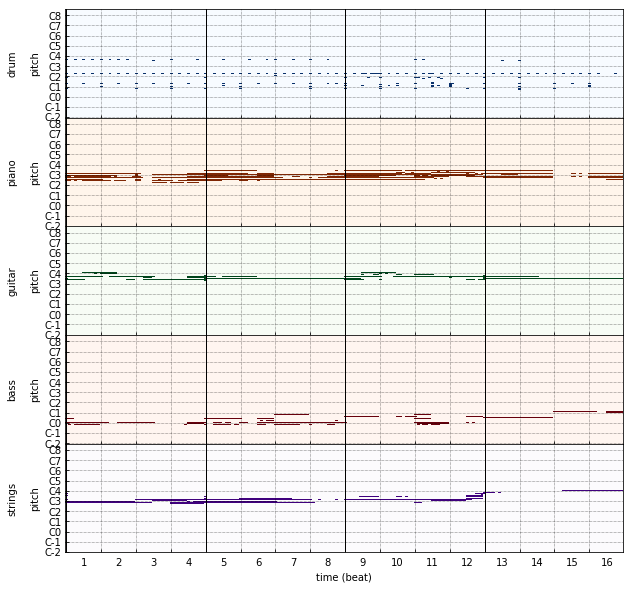

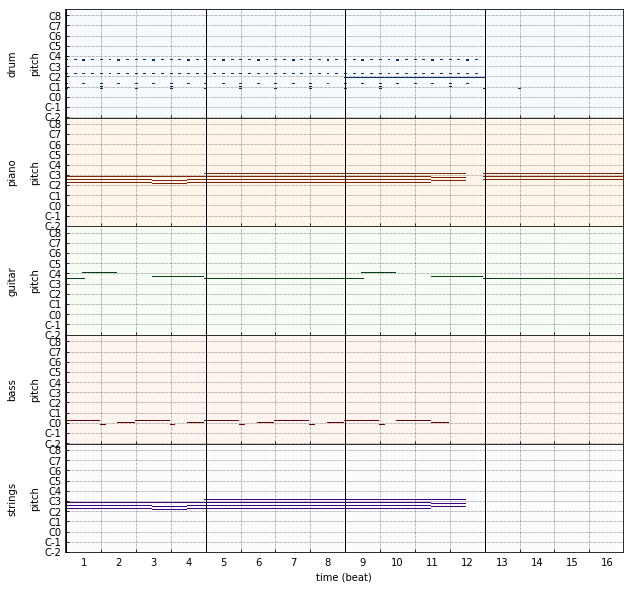

In [21]:
N_DISPLAY = 3
for i in range(N_DISPLAY):
    i0 = random.randint(len(tracks_grouped))
    i1 = random.randint(len(tracks_grouped))

    z1 = z[i0].numpy()
    z2 = z[i1].numpy()
    t0 = tracks_grouped[i0]
    t1 = tracks_grouped[i1]
    z_interp = vis.interpolate(z1, z2, 5)

    for i in range(5):
        if i == 0 or i == 4:
            # Just plot the track
            title = '{} (Original)'.format(str(i))
            mt = vis.to_multitrack(t0 if i == 0 else t1)
        else:
            title = '{} (Recon)'.format(str(i))
            zi = z_interp[i]
            zit = torch.tensor(zi).to(z.device).float().unsqueeze(0)
            with torch.no_grad():
                mt = [(t.numpy() > 0.0)[0] for t in model.decode(zit)]
            mt = vis.to_multitrack(mt)
        audio = vis.synthesize(mt, rate=RATE)
        vis.ipy_display(audio, title, rate=RATE)
        to_plot = mt_recon
        fig, axs = plot_multitrack(mt)
        plt.show()

# Samples

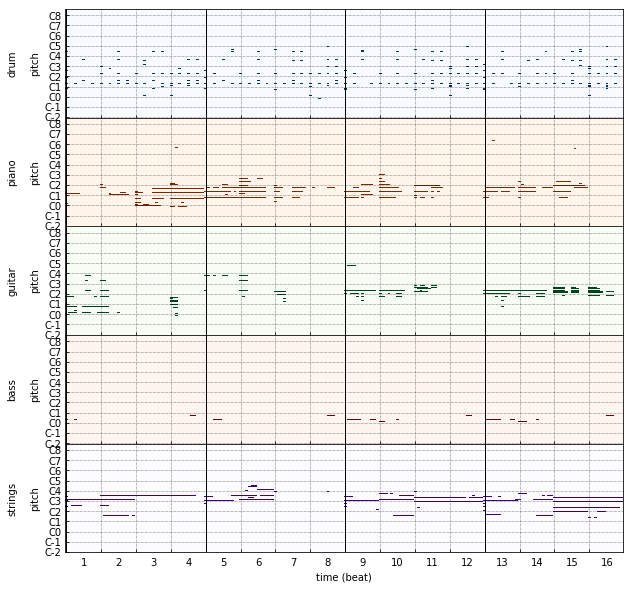

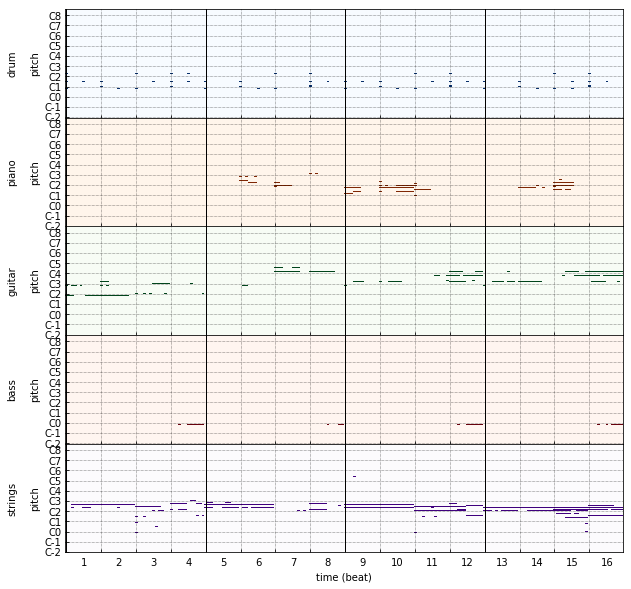

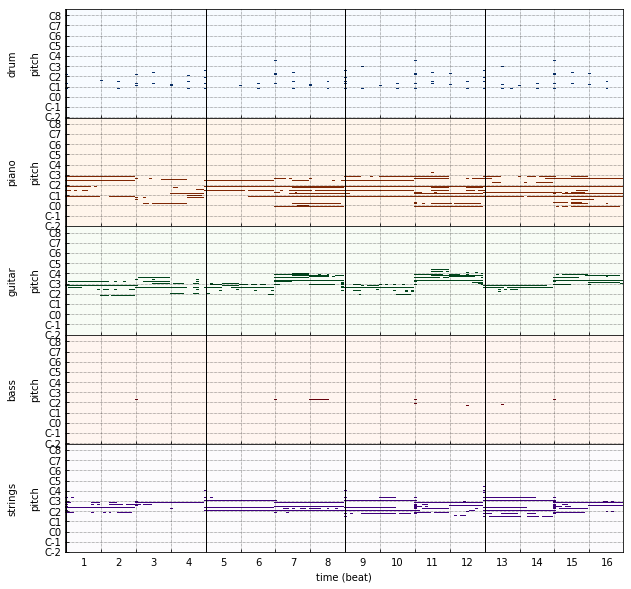

In [25]:
N_DISPLAY = 3
z_samp = torch.zeros((N_DISPLAY, args.hidden_size)).normal_()

with torch.no_grad():
    track_samp = model.decode(z_samp)
    
track_samp = [(t.numpy() > 0.0) for t in track_samp]
track_samp_grouped = [tuple(t[i] for t in track_samp) for i in range(N_DISPLAY)]
for i, tsg in enumerate(track_samp_grouped):
    mt = vis.to_multitrack(tsg)
    audio = vis.synthesize(mt, rate=RATE)
    vis.ipy_display(audio, 'Sample {}'.format(i), rate=RATE)
    fig, axs = plot_multitrack(mt)
    plt.show()